In [1]:
# Import libraries and dependencies
import os
 
import datetime as dt
from pathlib import Path    
    
import pandas as pd
import numpy as np
import panel as pn

#from panel.interact import interact
import plotly.express as px
#import hvplot.pandas
pn.extension("plotly")

import matplotlib.pyplot as plt
%matplotlib inline

#from dotenv import load_dotenv
#load_dotenv()


from MCForecastTools import MCSimulation


Bad key savefig.frameon in file /Users/adnanquaderi/opt/anaconda3/envs/pyvizenv/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 421 ('savefig.frameon : True')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.4/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.level in file /Users/adnanquaderi/opt/anaconda3/envs/pyvizenv/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 472 ('verbose.level  : silent      # one of silent, helpful, debug, debug-annoying')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.4/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.fileo in file /Users/adnanquaderi/opt/anaconda3/envs/pyvizenv/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 473 ('verbose.fileo  : sys.stdout

In [2]:
os.getcwd()

'/Users/adnanquaderi/Desktop/Penn/Project-1'

### Read and process SPY ETF Price Data

In [3]:

# Reading SPY price history
spy_price_csv = Path("SPY.csv")
spy_price = pd.read_csv(
    spy_price_csv, index_col="Date", infer_datetime_format=True, parse_dates=True)
spy_price = spy_price.sort_index()
spy_price = spy_price.dropna()
spy_price["Close"] = spy_price["Close"].astype("float")
spy_price = spy_price.rename(columns={"Close": "close"})
spy_price.head(2)

,close
Date,
2015-01-02 16:00:00,205.43
2015-01-05 16:00:00,201.76


In [4]:
# Reset index in SPY data
spy_price_close =  spy_price.reset_index()
spy_price_close["Date"] = spy_price_close["Date"].dt.date
spy_price_close.head(2)

,Date,close
0,2015-01-02,205.43
1,2015-01-05,201.76


In [5]:
#Prep SPY prices for input to Monte Carlo function (Multi-index, 2 level for compatability with MC function)

spy_price_MC = spy_price_close
spy_price_MC.set_index("Date", drop=True)
newcols = [
    ("Date", ""), 
    ("SPY", "close")
]
spy_price_MC.columns = pd.MultiIndex.from_tuples(newcols)
spy_price_MC = spy_price_MC.set_index(("Date"))
spy_price_MC 

,SPY
,close
Date,
2015-01-02,205.43
2015-01-05,201.76
2015-01-06,199.82
2015-01-07,202.31
2015-01-08,205.90
...,...
2021-10-25,455.55
2021-10-26,455.96



### Read and process Bitcoin price data

In [6]:
# Reading BTC price history

btc_price_csv = Path("Bitcoin2.csv")
btc_price = pd.read_csv(
    btc_price_csv, index_col="Date", infer_datetime_format=True, parse_dates=True)
btc_price = btc_price.sort_index()
btc_price = btc_price.dropna()
btc_price["Close"] = btc_price["Close"].astype("float")
btc_price = btc_price.rename(columns={"Close": "close"})
btc_price.head(2)

,close
Date,
2015-11-19 23:58:00,326.41
2015-11-20 23:58:00,322.39


In [7]:
# Reset index in BTC data
btc_price_close =  btc_price.reset_index()
btc_price_close["Date"] = btc_price_close["Date"].dt.date
btc_price_close.head(2)

,Date,close
0,2015-11-19,326.41
1,2015-11-20,322.39


In [8]:
#Prep BTC prices for input to Monte Carlo function (Multi-index, 2 level for compatability with MC function)

btc_price_MC = btc_price_close
btc_price_MC.set_index("Date", drop=True)
newcols = [
    ("Date", ""), 
    ("BTC", "close")
]
btc_price_MC.columns = pd.MultiIndex.from_tuples(newcols)
btc_price_MC = btc_price_MC.set_index(("Date"))
btc_price_MC

,BTC
,close
Date,
2015-11-19,326.41
2015-11-20,322.39
2015-11-21,327.00
2015-11-22,323.71
2015-11-23,323.00
...,...
2021-10-27,58455.40
2021-10-28,60608.10


### Read and process Ethereum price data

In [9]:
# Reading Ethereum prices from csv file
eth_price_csv = Path("Ethereum.csv")
eth_price = pd.read_csv(
    eth_price_csv, index_col="Date", infer_datetime_format=True, parse_dates=True)
eth_price = eth_price.sort_index()
eth_price = eth_price.dropna()
eth_price["Close"] = eth_price["Close"].astype("float")
eth_price = eth_price.rename(columns={"Close": "close"})
eth_price.head(5)

,close
Date,
2016-10-14 23:58:00,11.92
2016-10-15 23:58:00,11.95
2016-10-16 23:58:00,11.95
2016-10-17 23:58:00,11.96
2016-10-18 23:58:00,12.54


In [10]:
#Reset ethereum data index
eth_price_close = eth_price.reset_index()
eth_price_close["Date"] = eth_price_close["Date"].dt.date
eth_price_close.head(2)

,Date,close
0,2016-10-14,11.92
1,2016-10-15,11.95


In [11]:
#Prep ETH price for input to Monte Carlo function (Multi-index, 2 level for compatability with MC function)

eth_price_MC = eth_price_close
eth_price_MC.set_index("Date", drop=True)
newcols = [
    ("Date", ""), 
    ("ETH", "close")
]
eth_price_MC.columns = pd.MultiIndex.from_tuples(newcols)
eth_price_MC = eth_price_MC.set_index(("Date"))
eth_price_MC 

,ETH
,close
Date,
2016-10-14,11.92
2016-10-15,11.95
2016-10-16,11.95
2016-10-17,11.96
2016-10-18,12.54
...,...
2021-10-27,3925.44
2021-10-28,4288.26


### Compute Daily Returns

In [12]:
# Get SPY Daily Returns

spy_returns = spy_price.pct_change().dropna()
spy_returns.head(5)

,close
Date,
2015-01-05 16:00:00,-0.017865
2015-01-06 16:00:00,-0.009615
2015-01-07 16:00:00,0.012461
2015-01-08 16:00:00,0.017745
2015-01-09 16:00:00,-0.008014


In [13]:
btc_returns = btc_price.pct_change().dropna()
btc_returns.head(5)

,close
Date,
2015-11-20 23:58:00,-0.012316
2015-11-21 23:58:00,0.014299
2015-11-22 23:58:00,-0.010061
2015-11-23 23:58:00,-0.002193
2015-11-24 23:58:00,-0.006192


In [14]:
# Get Ethereum Daily Returns

eth_returns = eth_price.pct_change().dropna().copy()
eth_returns.head(5)

,close
Date,
2016-10-15 23:58:00,0.002517
2016-10-16 23:58:00,0.000000
2016-10-17 23:58:00,0.000837
2016-10-18 23:58:00,0.048495
2016-10-19 23:58:00,-0.042265


## Plot Daily Returns

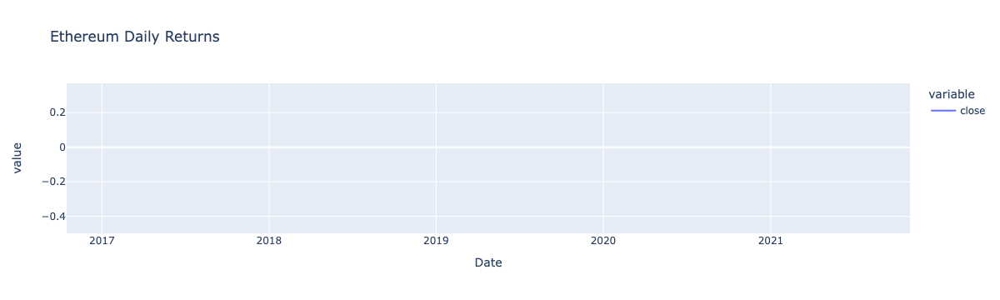

In [15]:
# Plot Ethereum Daily Returns using plotly


px.line(eth_returns, title="Ethereum Daily Returns")

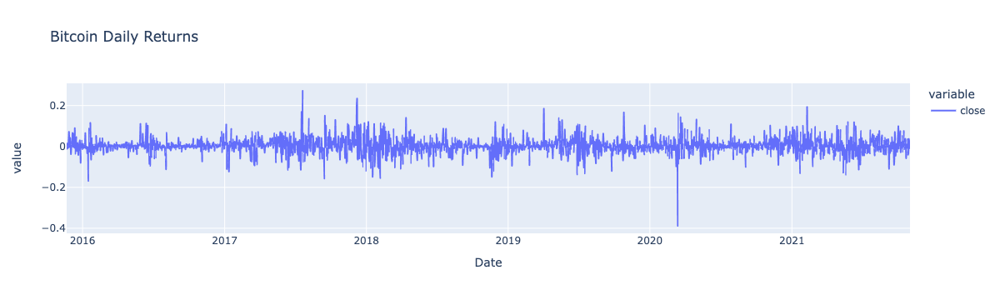

In [16]:
# Plot Bitcoin Daily Returns using plotly


px.line(btc_returns, title="Bitcoin Daily Returns")

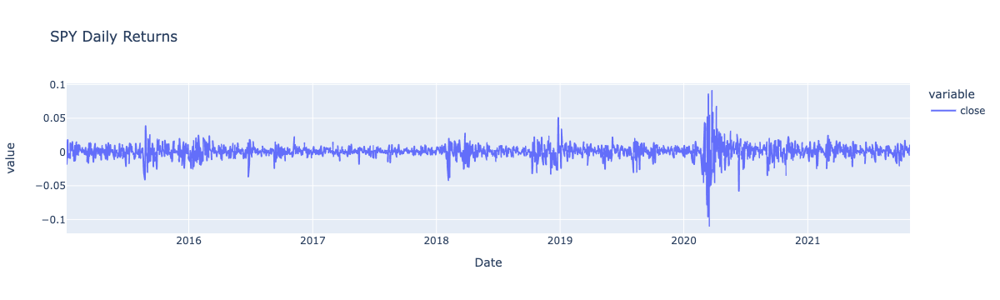

In [17]:

#Plot SPY Daily Returns using plotly

px.line(spy_returns, title="SPY Daily Returns")


### Prepping data for pandas dataframe concatenation

In [18]:
# Prepping SPY data for pandas dataframe Concatenation

spy_returns_1 = spy_returns.rename(columns={"close": "SPY"})
spy_returns_1 = spy_returns_1.reset_index()
spy_returns_1["Date"] = spy_returns_1["Date"].dt.date
spy_returns_1 = spy_returns_1.set_index("Date")
spy_returns_1.head(2)

,SPY
Date,
2015-01-05,-0.017865
2015-01-06,-0.009615


In [19]:
# Prepping BTC data for pandas dataframe Concatenation

btc_returns_1 = btc_returns.rename(columns={"close": "BTC"})
btc_returns_1 = btc_returns_1.reset_index()
btc_returns_1["Date"] = btc_returns_1["Date"].dt.date
btc_returns_1 = btc_returns_1.set_index("Date")
btc_returns_1.head(2)

,BTC
Date,
2015-11-20,-0.012316
2015-11-21,0.014299


In [20]:
# Prepping Ethereum data for pandas dataframe Concatenation

eth_returns_1 = eth_returns.rename(columns={"close": "Ethereum"})
eth_returns_1 = eth_returns_1.reset_index()
eth_returns_1["Date"] = eth_returns_1["Date"].dt.date
eth_returns_1 = eth_returns_1.set_index("Date")
eth_returns_1.head(3)

,Ethereum
Date,
2016-10-15,0.002517
2016-10-16,0.000000
2016-10-17,0.000837


In [21]:
#BLOCK of code used to Concatenate daily return data :  SPY, Ethereum, Bitcoin


spy_eth_btc_combo_returns = pd.concat([eth_returns_1, btc_returns_1, spy_returns_1], axis=1, join="outer")
spy_eth_btc_combo_returns.dropna(inplace=True)
spy_eth_btc_combo_returns.head(5)


,Ethereum,BTC,SPY
Date,,,
2016-10-17,0.000837,-0.003676,-0.003472
2016-10-18,0.048495,-0.006958,0.006262
2016-10-19,-0.042265,-0.008377,0.002667
2016-10-20,0.004163,-0.002763,-0.001867
2016-10-21,-0.000829,0.004426,0.000468


In [22]:
#BLOCK of code used to Concatenate daily return data :  SPY, Ethereum


spy_eth_combo_returns = pd.concat([eth_returns_1, spy_returns_1], axis=1, join="outer")
spy_eth_combo_returns.dropna(inplace=True)
spy_eth_combo_returns.head(5)


,Ethereum,SPY
Date,,
2016-10-17,0.000837,-0.003472
2016-10-18,0.048495,0.006262
2016-10-19,-0.042265,0.002667
2016-10-20,0.004163,-0.001867
2016-10-21,-0.000829,0.000468



## Ethereum and SPY Blended Portfolios:
Aggressive, Moderate, and Risk Averse

In [23]:
# Blended Portfolio Processing

eth_weight = {
    "Risk_Averse" : 0.02,
    "Moderate" : 0.05,
    "Aggressive" : 0.25
}

print("SPY weight " ,1 - eth_weight['Moderate'])

print("ETH weight ", eth_weight['Moderate'])

SPY weight  0.95
ETH weight  0.05


In [24]:
# Aggressive Portfolio of SPY & Ethereum  (High Crypto Allocation)

spy_eth_btc_combo_returns['Aggressive'] = spy_eth_combo_returns['Ethereum'] * eth_weight['Aggressive'] + spy_eth_combo_returns['SPY'] * (1- eth_weight['Aggressive'])



In [25]:

# Moderate Portfolio of SPY & Ethereum (Medium Crypto Allocation)

spy_eth_btc_combo_returns['Moderate'] = spy_eth_combo_returns['Ethereum'] * eth_weight['Moderate'] + spy_eth_combo_returns['SPY'] * (1- eth_weight['Moderate'])



In [26]:
# Conservative Portfolio of SPY & Ethereum (Low Crypto Allocation)

spy_eth_btc_combo_returns['Risk_Averse'] = spy_eth_combo_returns['Ethereum'] * eth_weight['Risk_Averse'] + spy_eth_combo_returns['SPY'] * (1- eth_weight['Risk_Averse'])



In [27]:
spy_eth_btc_combo_returns.head(3)

,Ethereum,BTC,SPY,Aggressive,Moderate,Risk_Averse
Date,,,,,,
2016-10-17,0.000837,-0.003676,-0.003472,-0.002395,-0.003257,-0.003386
2016-10-18,0.048495,-0.006958,0.006262,0.016821,0.008374,0.007107
2016-10-19,-0.042265,-0.008377,0.002667,-0.008566,0.000421,0.001769



## Box Plots of Daily Returns
A boxplot is a standardized way of displaying the distribution of data based on a five number summary (“minimum”, first quartile (Q1), median, third quartile (Q3), and “maximum”). ... It can also tell you if your data is symmetrical, how tightly your data is grouped, and if and how your data is skewed.

<AxesSubplot:title={'center':'SPY, Ethereum, and Portfolio Daily Return Box Plots'}>

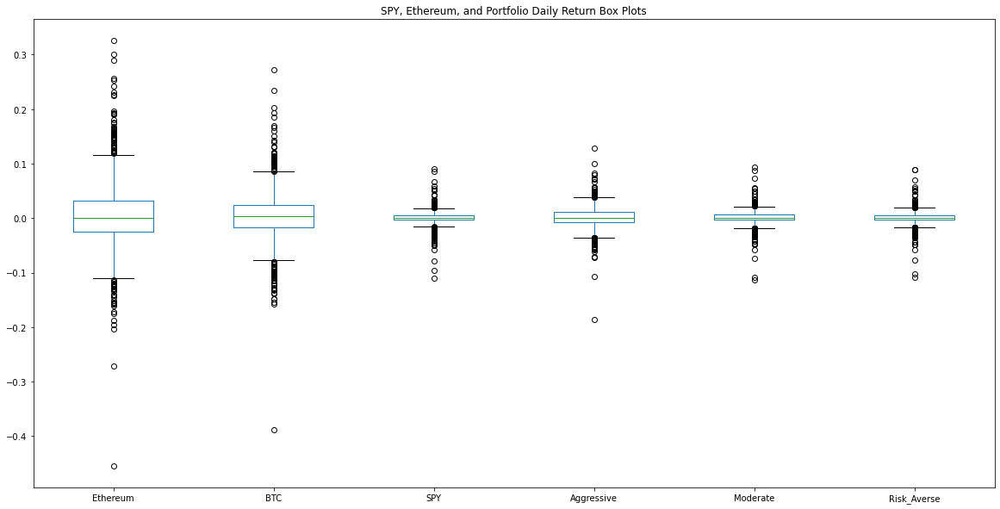

In [28]:
# Box Plot of Daily Returns 

spy_eth_btc_combo_returns.plot.box(figsize=(20, 10), title="SPY, Ethereum, and Portfolio Daily Return Box Plots") 


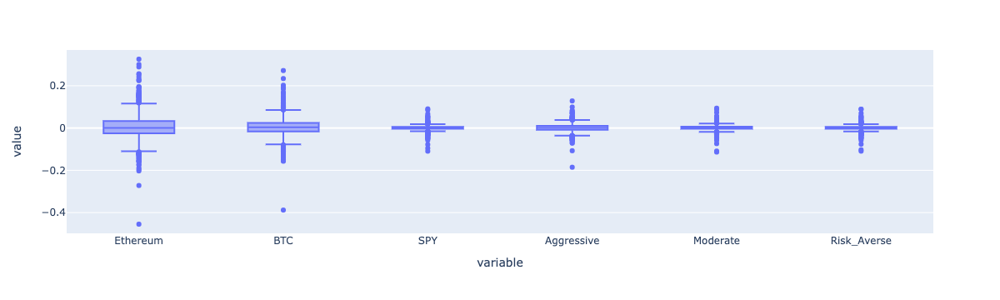

In [29]:
box_plot = px.box(spy_eth_btc_combo_returns, title ="Box Plot of Daily Returns")
px.box(spy_eth_btc_combo_returns)

## Rolling 1y Volatility Plots (Using standard deviation function)

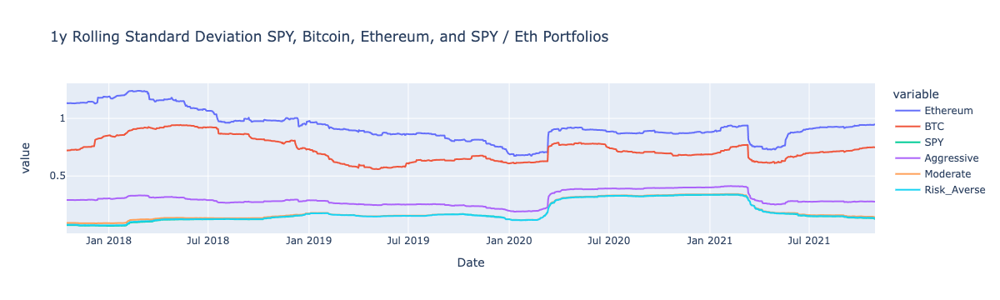

In [30]:
# SPY, Ethereum, Portfolio Rolling 1y Volatility (std)

spy_eth_btc_combo_std = spy_eth_btc_combo_returns.std() * np.sqrt(252)
spy_eth_btc_combo_std = (np.sqrt(252)*spy_eth_btc_combo_returns).rolling(window=252).std().dropna()

plotly_std = px.line(spy_eth_btc_combo_std, title="1y Rolling Standard Deviation SPY, Bitcoin, Ethereum, and SPY / Eth Portfolios")
px.line(spy_eth_btc_combo_std, title="1y Rolling Standard Deviation SPY, Bitcoin, Ethereum, and SPY / Eth Portfolios")

## Cumulative Return Plots

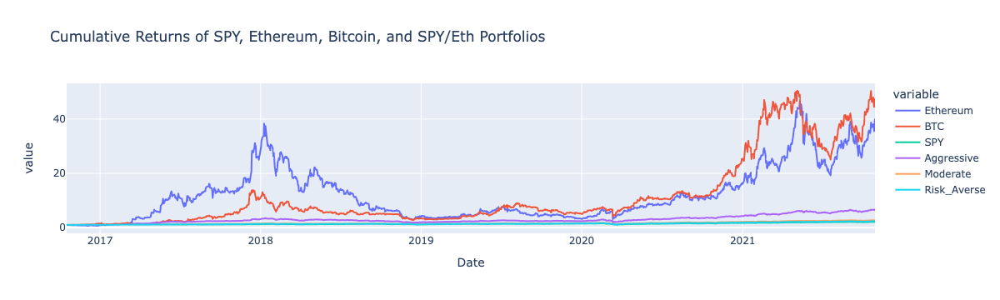

In [31]:
# Cumulative Return calculation and plot

spy_eth_btc_combo_cum_returns_1 = (1+spy_eth_btc_combo_returns).cumprod()
#spy_eth_btc_combo_cum_returns_1 = spy_eth_combo_returns).rolling(window=252).std().dropna()

plotly_cum_return = px.line(spy_eth_btc_combo_cum_returns_1, title="Cumulative Returns of SPY, Ethereum, Bitcoin, and SPY/Eth Portfolios")
px.line(spy_eth_btc_combo_cum_returns_1, title="Cumulative Returns of SPY, Ethereum, Bitcoin, and SPY/Eth Portfolios")




## Rolling 3m Beta Plots

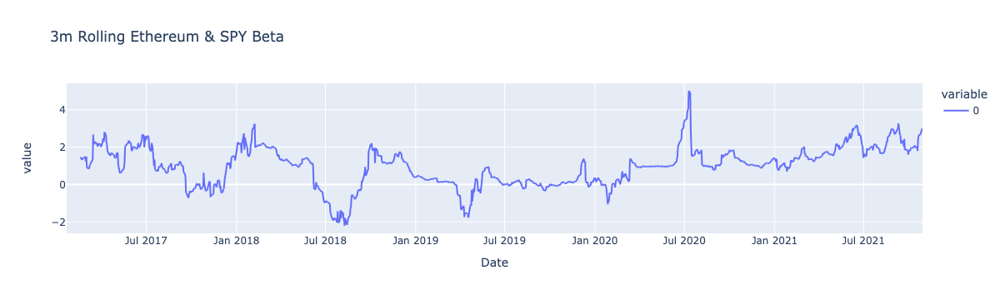

In [32]:
# Calculate Rolling 3 month Covariances against SPY

covariance_eth = spy_eth_btc_combo_returns["Ethereum"].rolling(window=85).cov(spy_eth_btc_combo_returns["SPY"]).dropna()
covariance_btc = spy_eth_btc_combo_returns["BTC"].rolling(window=66).cov(spy_eth_btc_combo_returns["SPY"]).dropna()


covariance_aggressive= spy_eth_btc_combo_returns["Aggressive"].rolling(window=66).cov(spy_eth_btc_combo_returns["SPY"]).dropna()
covariance_moderate= spy_eth_btc_combo_returns["Moderate"].rolling(window=66).cov(spy_eth_btc_combo_returns["SPY"]).dropna()
covariance_risk_averse= spy_eth_btc_combo_returns["Risk_Averse"].rolling(window=66).cov(spy_eth_btc_combo_returns["SPY"]).dropna()

# Calculate Rolling 3 month variance of S&P 
variance_spy = spy_eth_btc_combo_returns["SPY"].rolling(window=66).var().dropna()


# Calculate Rolling Beta

beta_eth = covariance_eth / variance_spy
beta_btc = covariance_btc / variance_spy

beta_aggressive = covariance_aggressive / variance_spy
beta_moderate = covariance_moderate / variance_spy
beta_risk_averse= covariance_risk_averse / variance_spy

# Plot selected beta trend


be = px.line(beta_eth, title="3m Rolling Ethereum & SPY Beta")
px.line(beta_eth, title="3m Rolling Ethereum & SPY Beta")


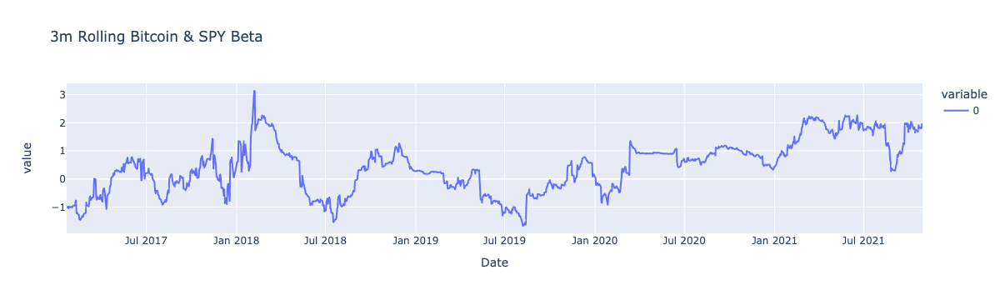

In [33]:
bb = px.line(beta_btc, title="3m Rolling Bitcoin & SPY Beta")
px.line(beta_btc, title="3m Rolling Bitcoin & SPY Beta")


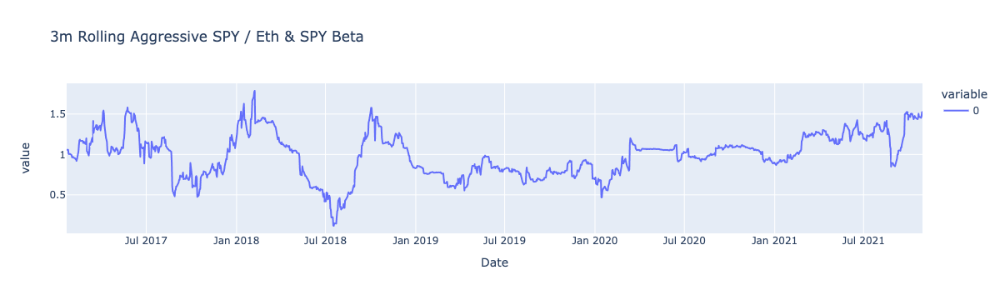

In [34]:
ba = px.line(beta_aggressive, title="3m Rolling Aggressive SPY / Eth & SPY Beta")
px.line(beta_aggressive, title="3m Rolling Aggressive SPY / Eth & SPY Beta")

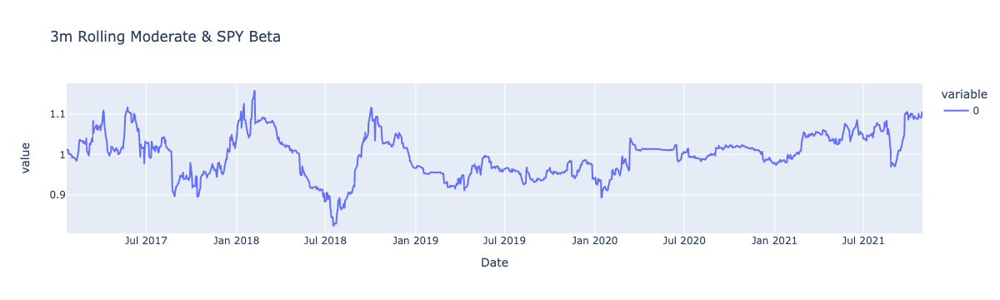

In [35]:
bm = px.line(beta_moderate, title="3m Rolling Moderate & SPY Beta")
px.line(beta_moderate, title="3m Rolling Moderate & SPY Beta")


## 1y Rolling Sharpe Ratios And Table

In [36]:
sharpe_ratios = (spy_eth_btc_combo_returns.rolling(window=252).mean() * 252) / (spy_eth_btc_combo_returns.rolling(window=252).std() * np.sqrt(252))
sharpe_ratios.dropna(inplace=True)

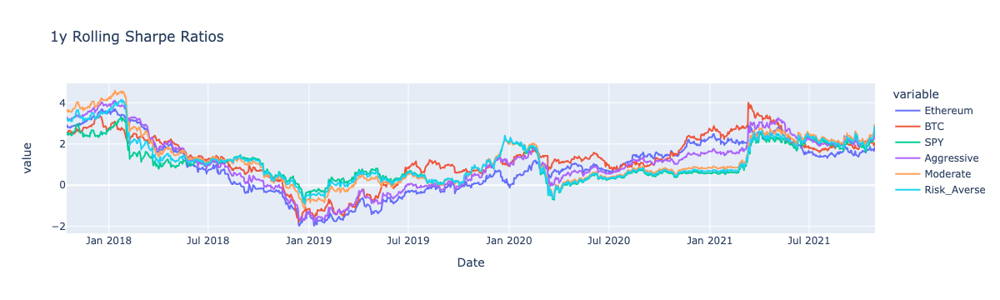

In [37]:
sharpe = px.line(sharpe_ratios, title="1y Rolling Sharpe Ratios")
px.line(sharpe_ratios, title="1y Rolling Sharpe Ratios")

### Process Data for Sharpe Ratio Table

In [38]:
sharpe_1y = (spy_eth_btc_combo_returns.iloc[-251:-1,:].mean() * 252) / (np.sqrt(252)*spy_eth_btc_combo_returns.iloc[-251:-1,:].std())
sharpe_1y 

Ethereum       1.819581
BTC            1.996945
SPY            2.729674
Aggressive     2.501328
Moderate       2.962414
Risk_Averse    2.866591
dtype: float64

In [39]:
sharpe_5y = (spy_eth_btc_combo_returns.mean() * 252) / (np.sqrt(252)*spy_eth_btc_combo_returns.std())
sharpe_5y 

Ethereum       1.246431
BTC            1.423920
SPY            0.907932
Aggressive     1.408550
Moderate       1.139987
Risk_Averse    1.009825
dtype: float64

In [40]:
s1 = pd.DataFrame(sharpe_1y)
s5 = pd.DataFrame(sharpe_5y)

In [41]:
sharpe_1y = sharpe_1y.rename("Sharpe Ratio - 1y")
sharpe_5y = sharpe_5y.rename("Sharpe Ratio - 5y")

In [42]:
#Create table of 1y and 5y Sharpe Ratios
sharpe_table = pd.concat([sharpe_1y, sharpe_5y], join="outer", axis=1)
sharpe_table

,Sharpe Ratio - 1y,Sharpe Ratio - 5y
Ethereum,1.819581,1.246431
BTC,1.996945,1.423920
SPY,2.729674,0.907932
Aggressive,2.501328,1.408550
Moderate,2.962414,1.139987
Risk_Averse,2.866591,1.009825


In [43]:
#Check start date of 5y data
spy_eth_btc_combo_returns.head(2)

,Ethereum,BTC,SPY,Aggressive,Moderate,Risk_Averse
Date,,,,,,
2016-10-17,0.000837,-0.003676,-0.003472,-0.002395,-0.003257,-0.003386
2016-10-18,0.048495,-0.006958,0.006262,0.016821,0.008374,0.007107


In [44]:
#Check start date of 1y data
spy_eth_btc_combo_returns.iloc[-252:-250,:].head(2)

,Ethereum,BTC,SPY,Aggressive,Moderate,Risk_Averse
Date,,,,,,
2020-10-30,-0.010913,0.008524,-0.010425,-0.010547,-0.010449,-0.010435
2020-11-02,-0.031726,-0.013478,0.011208,0.000475,0.009062,0.010350


## ------------  1y Forward Projection - Ethereum :  Monte Carlo # 1 -----------------

In [45]:
# Create Monte Carlo function object

num_sims = 500
MC_Eth_new= MCSimulation(
    portfolio_data = eth_price_MC,
    num_simulation = num_sims,
    num_trading_days = 252*1
)

In [46]:



# Run Monte Carlo simulations to forecast one year daily returns

MC_Eth_new.calc_cumulative_return()



Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.050773,0.875396,1.109101,0.938340,1.045492,0.958606,1.000395,1.032766,1.051834,1.045960,...,1.066220,1.079505,1.045810,0.971170,1.107659,1.002221,0.974870,1.044716,1.008266,1.094092
2,1.090889,0.921934,1.177974,0.905032,1.125828,0.998364,0.959628,1.117918,1.103387,1.028882,...,1.018544,1.045816,1.048267,0.963767,1.135884,1.017681,0.949561,1.021099,0.929018,1.055221
3,1.094850,0.933745,1.222326,0.953425,1.179776,1.136781,1.013295,1.223663,1.162782,1.065198,...,1.028101,0.951831,1.008712,0.915526,1.139643,0.971446,0.971727,0.981388,0.969778,1.135674
4,1.075361,0.955686,1.203287,1.037254,1.261530,1.112149,0.953839,1.276612,1.077476,1.218754,...,1.012256,0.904883,1.041016,0.927481,1.111226,1.036288,1.007046,0.982925,1.093696,1.088151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,3.372687,1.602700,4.428789,2.269614,2.524746,2.437204,2.931826,1.232940,2.096279,2.172857,...,2.164935,2.115370,2.040472,1.194588,0.681862,4.303871,2.555285,0.870930,1.513317,1.545197
249,3.247757,1.738435,4.540763,2.283328,2.501788,2.523545,2.820132,1.281509,1.886381,2.131849,...,2.268882,2.079403,2.049394,1.242586,0.683817,4.562443,2.784824,0.889080,1.660197,1.579380
250,3.377593,1.696100,4.768722,2.165861,2.199414,2.320708,2.473477,1.211785,1.871092,2.163631,...,2.316051,1.836051,2.140355,1.269954,0.695646,4.240499,2.817680,0.924281,1.749802,1.728547
251,3.405141,1.705280,4.834064,2.151245,2.271745,2.483515,2.716651,1.256826,1.655191,2.191222,...,2.444085,1.858752,2.411948,1.360429,0.662339,3.980925,2.660723,0.995590,1.803095,1.868477


In [47]:

# Compute summary statistics from the simulated daily returns

simulated_eth_returns_data = {
    "Mean": list(MC_Eth_new.simulated_return.mean(axis=1)),
    "Median": list(MC_Eth_new.simulated_return.median(axis=1)),
    "Min": list(MC_Eth_new.simulated_return.min(axis=1)),
    "Max": list(MC_Eth_new.simulated_return.max(axis=1))
}

# Create a DataFrame with the summary statistics

df_simulated_eth_returns = pd.DataFrame(simulated_eth_returns_data)

# Display sample data

df_simulated_eth_returns.head()



,Mean,Median,Min,Max
0,1.000000,1.000000,1.000000,1.000000
1,1.003284,1.004676,0.841119,1.184378
2,1.009484,1.008637,0.699984,1.237992
3,1.016053,1.015099,0.665398,1.311541
4,1.021506,1.012986,0.660739,1.427992


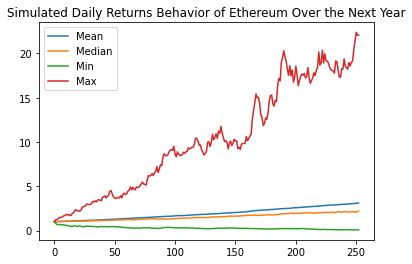

In [48]:
# Plot simulated returns over next year

eth_sim = df_simulated_eth_returns.plot(title="Simulated Daily Returns Behavior of Ethereum Over the Next Year")


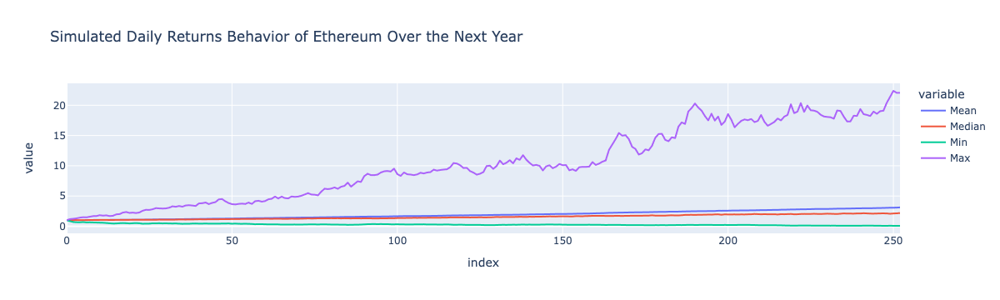

In [49]:
# Plot simulated returns over next year using plotly

px.line(df_simulated_eth_returns, title="Simulated Daily Returns Behavior of Ethereum Over the Next Year")


In [50]:
# Fetch summary statistics from the Monte Carlo simulation results

eth_tbl = MC_Eth_new.summarize_cumulative_return()

# Print summary statistics
print(eth_tbl)


count           500.000000
mean              3.116411
std               2.997681
min               0.071282
25%               1.282931
50%               2.182546
75%               3.744882
max              22.052482
95% CI Lower      0.413936
95% CI Upper     12.152462
Name: 252, dtype: float64


In [51]:

# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $10,000 investments in Ethereum

eth_ci_lower = round(eth_tbl[8]*10000,2)
eth_ci_upper = round(eth_tbl[9]*10000,2)

# Print results

print(f"There is a 95% chance that an initial investment of $10,000 in Ethereum"
      f" over the next year will end within in the range of"
      f" ${eth_ci_lower} and ${eth_ci_upper}.")


There is a 95% chance that an initial investment of $10,000 in Ethereum over the next year will end within in the range of $4139.36 and $121524.62.


In [52]:

# Set initial investment for Ethereum

eth_initial_investment = 10000

# Multiply an initial investment by the daily returns of simulative stock prices to return the progression of daily returns in terms of money

eth_cumulative_pnl = eth_initial_investment * df_simulated_eth_returns

# Display sample data
eth_cumulative_pnl.head()


,Mean,Median,Min,Max
0,10000.000000,10000.000000,10000.000000,10000.000000
1,10032.837997,10046.758331,8411.188749,11843.776700
2,10094.836641,10086.368134,6999.839496,12379.918402
3,10160.525980,10150.994064,6653.982486,13115.408731
4,10215.058773,10129.855818,6607.385438,14279.921398


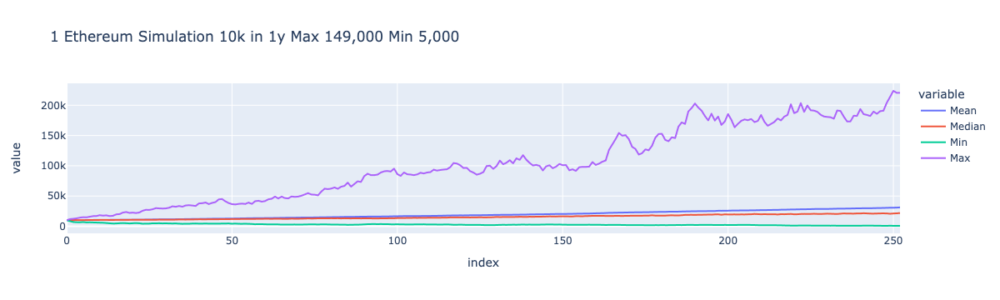

In [53]:
 # Use the 'plot' function to create a chart of the simulated profits/losses
 
MC_ETH_plot = px.line(eth_cumulative_pnl, title="1 Ethereum Simulation 10k in 1y Max 149,000 Min 5,000")
px.line(eth_cumulative_pnl, title="1 Ethereum Simulation 10k in 1y Max 149,000 Min 5,000")


## ----- 1y Forward Projection - SPY :  Monte Carlo # 2 ------------

In [55]:
# Create Monte Carlo function object for SPY

num_sims_2 = 500

MC_SPY_new= MCSimulation(
    portfolio_data = spy_price_MC,
    num_simulation = num_sims_2,
    num_trading_days = 252*1
)

In [56]:
# Run Monte Carlo simulations to forecast one year daily returns for SPY

MC_SPY_new.calc_cumulative_return()



Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.010678,1.007592,0.988225,0.998947,1.001994,1.010329,0.980145,0.993138,1.021314,0.999426,...,0.986950,0.993235,1.012792,1.009668,1.020020,0.999853,1.011030,1.003897,1.000737,0.989609
2,1.019387,1.015514,0.990903,0.987802,1.017716,1.040475,0.971007,0.985609,1.029794,0.995859,...,1.002761,1.006815,1.002926,1.007023,1.018533,1.009432,1.025140,1.011174,1.008366,1.005073
3,1.026245,1.024041,0.981705,0.992793,1.021907,1.050921,0.973844,0.992025,1.025933,1.002184,...,1.003795,1.016507,1.002060,1.012737,1.006037,1.020871,1.038225,1.020000,1.000654,1.018656
4,1.019664,1.017001,1.008124,0.981105,1.020666,1.046492,0.972805,1.012023,1.031425,0.998435,...,1.020872,1.030741,1.016654,1.007135,1.035539,1.022846,1.028642,1.009774,1.002516,1.019187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.181642,0.935761,1.189997,1.269740,0.675627,1.075899,1.032264,1.083385,1.669358,1.005907,...,1.174060,1.385707,1.295880,1.489034,0.908131,1.373596,1.428416,1.210949,0.894113,1.306036
249,1.205145,0.931597,1.197482,1.267536,0.672234,1.071586,1.027803,1.064389,1.657602,0.977718,...,1.183176,1.368654,1.310156,1.523098,0.901127,1.373149,1.417679,1.222155,0.883058,1.306779
250,1.213780,0.930761,1.210936,1.262440,0.675746,1.052405,1.018722,1.071967,1.658161,0.981730,...,1.199219,1.356304,1.323312,1.527377,0.902172,1.369429,1.426374,1.241267,0.881062,1.308065
251,1.230980,0.935228,1.219034,1.279159,0.668375,1.041210,1.013026,1.055209,1.684461,0.977021,...,1.171242,1.358835,1.312110,1.557231,0.909988,1.364561,1.413705,1.244052,0.891372,1.318456


In [57]:
# Compute summary statistics from the simulated daily returns for SPY

simulated_spy_returns_data = {
    "Mean": list(MC_SPY_new.simulated_return.mean(axis=1)),
    "Median": list(MC_SPY_new.simulated_return.median(axis=1)),
    "Min": list(MC_SPY_new.simulated_return.min(axis=1)),
    "Max": list(MC_SPY_new.simulated_return.max(axis=1))
}

# Create a DataFrame with the summary statistics for SPY

df_simulated_spy_returns = pd.DataFrame(simulated_spy_returns_data)

# Display sample data for SPY

df_simulated_spy_returns.head(10)



,Mean,Median,Min,Max
0,1.000000,1.000000,1.000000,1.000000
1,1.000746,1.001208,0.958309,1.036802
2,1.000650,1.001246,0.948436,1.049948
3,1.001415,1.002223,0.933506,1.053960
4,1.002272,1.001725,0.932958,1.072133
5,1.002876,1.003884,0.931070,1.082051
6,1.002920,1.002630,0.933892,1.084536
7,1.004174,1.005038,0.920243,1.099832
8,1.004450,1.004961,0.919957,1.117707
9,1.004020,1.004165,0.921325,1.109799


<AxesSubplot:title={'center':'Simulated Daily Returns Behavior of SPY Over the Next Year'}>

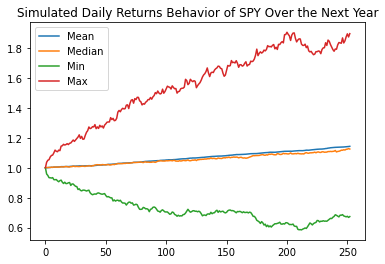

In [58]:
# Plot simulated returns over next year for SPY

df_simulated_spy_returns.plot(title="Simulated Daily Returns Behavior of SPY Over the Next Year")


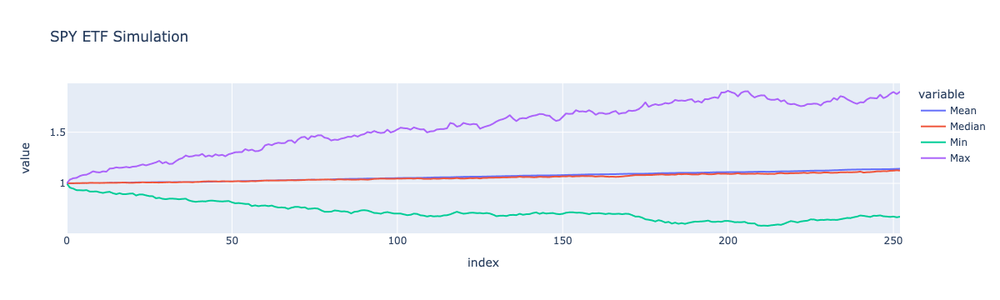

In [59]:
# Plot simulated returns over next year using plotly for SPY

px.line(df_simulated_spy_returns, title="SPY ETF Simulation")



In [60]:
# Fetch summary statistics from the Monte Carlo simulation results for SPY

spy_tbl = MC_SPY_new.summarize_cumulative_return()

# Print summary statistics
print(spy_tbl)


count           500.000000
mean              1.142893
std               0.212088
min               0.673860
25%               1.003142
50%               1.124826
75%               1.266993
max               1.895294
95% CI Lower      0.757225
95% CI Upper      1.599133
Name: 252, dtype: float64


In [61]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $10,000 investments in SPY

spy_ci_lower = round(spy_tbl[8]*10000,2)
spy_ci_upper = round(spy_tbl[9]*10000,2)

# Print results

print(f"There is a 95% chance that an initial investment of $10,000 in SPY"
      f" over the next year will end within in the range of"
      f" ${spy_ci_lower} and ${spy_ci_upper}.")


There is a 95% chance that an initial investment of $10,000 in SPY over the next year will end within in the range of $7572.25 and $15991.33.


In [62]:
# Set initial investment for SPY

spy_initial_investment = 10000

# Multiply an initial investment by the daily returns of simulative stock prices to return the progression of daily returns in terms of money

spy_cumulative_pnl = spy_initial_investment * df_simulated_spy_returns

# Display sample data
spy_cumulative_pnl.head()


,Mean,Median,Min,Max
0,10000.000000,10000.000000,10000.000000,10000.000000
1,10007.460985,10012.078564,9583.090209,10368.020943
2,10006.503626,10012.459711,9484.364697,10499.483562
3,10014.148390,10022.225241,9335.056204,10539.600396
4,10022.724705,10017.246674,9329.581922,10721.330417


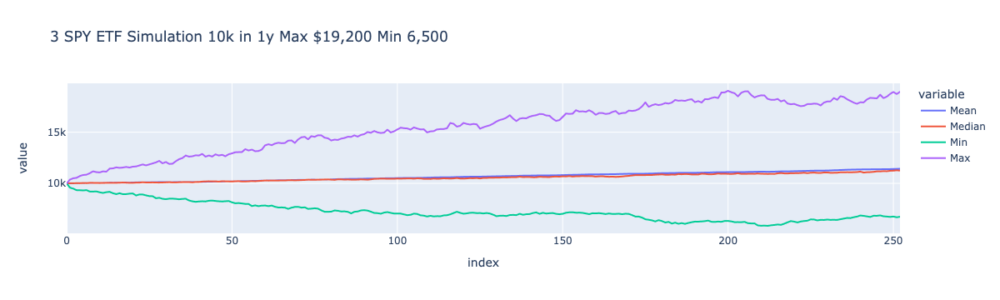

In [63]:
 # Use the 'plot' function to create a chart of the simulated profits/losses

    
MC_SPY_plot =  px.line(spy_cumulative_pnl, title="3 SPY ETF Simulation 10k in 1y Max $19,200 Min 6,500")
px.line(spy_cumulative_pnl, title="3 SPY ETF Simulation 10k in 1y Max $19,200 Min 6,500")



## ------------- 1y Forward Projection - Bitcoin :  Monte Carlo #3 ------------------------

In [64]:
# Create Monte Carlo function object for SPY

num_sims_3 = 500

MC_BTC_new= MCSimulation(
    portfolio_data = btc_price_MC,
    num_simulation = num_sims_3,
    num_trading_days = 252*1
)

In [65]:
# Run Monte Carlo simulations to forecast one year daily returns for SPY

MC_BTC_new.calc_cumulative_return()



Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.026517,1.078722,1.025902,1.023418,1.005594,1.001518,0.945530,0.969380,0.952182,0.991988,...,0.928747,1.010588,0.975573,1.053001,0.981102,1.020521,1.014832,0.983980,0.934365,0.938532
2,1.067817,1.087588,1.000716,0.974826,1.016079,0.989306,0.957560,0.982127,0.949998,1.001077,...,0.976376,0.988728,0.950025,0.999129,1.029537,1.043347,1.091887,0.994012,0.932318,0.888265
3,1.012194,1.060757,1.046052,1.013790,0.975224,0.967448,0.962122,1.016049,0.969172,1.064126,...,1.033684,0.991574,0.904346,1.038769,1.042190,1.068679,1.128456,0.953633,0.903574,0.893552
4,0.967640,1.040273,1.048887,1.039200,0.999736,1.005202,1.031503,1.008438,0.989680,1.017285,...,1.051003,1.032550,0.883134,1.054739,1.030158,1.048538,1.166801,0.909354,0.915986,0.940802
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,7.084031,0.864940,0.732958,2.054426,0.519695,4.079218,4.485366,2.477550,0.712745,1.881934,...,1.189376,2.113551,2.394428,2.506128,3.493144,1.839406,0.644141,1.282420,2.292636,2.049921
249,6.792321,0.874039,0.717271,2.071715,0.529066,4.254457,4.549421,2.620926,0.729971,1.902426,...,1.209597,2.218304,2.509327,2.565317,3.539251,1.751540,0.609769,1.234904,2.355847,2.035061
250,6.959668,0.909147,0.741491,2.009616,0.539712,4.375592,4.347765,2.581384,0.670767,1.794033,...,1.210481,2.134533,2.525109,2.765173,3.443169,1.806358,0.648637,1.309818,2.408228,2.078891
251,7.060314,0.894096,0.737837,2.046363,0.551827,4.363389,4.296174,2.469149,0.629543,1.814452,...,1.236468,2.177236,2.493780,2.772149,3.188673,1.876565,0.646166,1.404361,2.284945,1.991418


In [66]:
# Compute summary statistics from the simulated daily returns for Bitcoin

simulated_btc_returns_data = {
    "Mean": list(MC_BTC_new.simulated_return.mean(axis=1)),
    "Median": list(MC_BTC_new.simulated_return.median(axis=1)),
    "Min": list(MC_BTC_new.simulated_return.min(axis=1)),
    "Max": list(MC_BTC_new.simulated_return.max(axis=1))
}

# Create a DataFrame with the summary statistics for SPY

df_simulated_btc_returns = pd.DataFrame(simulated_btc_returns_data)

# Display sample data for SPY

df_simulated_btc_returns.head(10)



,Mean,Median,Min,Max
0,1.000000,1.000000,1.000000,1.000000
1,1.000150,0.999491,0.887044,1.132436
2,1.004444,1.004999,0.842108,1.184503
3,1.011018,1.010503,0.831962,1.209699
4,1.011184,1.009679,0.796347,1.279334
5,1.016080,1.014667,0.808761,1.350928
6,1.020598,1.015312,0.786957,1.318122
7,1.025335,1.024850,0.791688,1.434972
8,1.029500,1.022463,0.734314,1.394864
9,1.030036,1.023762,0.694575,1.358812


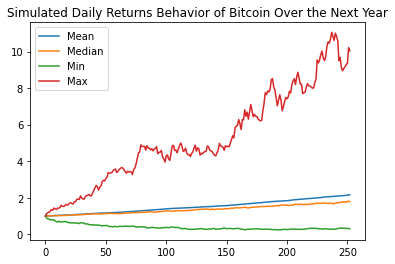

In [67]:
# Plot simulated returns over next year for BTC

btc_sim = df_simulated_btc_returns.plot(title="Simulated Daily Returns Behavior of Bitcoin Over the Next Year")


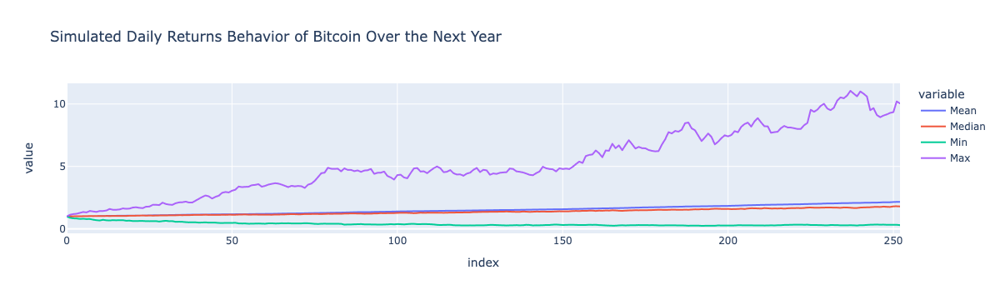

In [68]:
# Plot simulated returns over next year using plotly for Bitcoin

px.line(df_simulated_btc_returns, title="Simulated Daily Returns Behavior of Bitcoin Over the Next Year")



In [69]:
# Fetch summary statistics from the Monte Carlo simulation results for Bitcoin

btc_tbl = MC_BTC_new.summarize_cumulative_return()

# Print summary statistics
print(btc_tbl)
#df = pd.dataframe(btc_tbl)

count           500.000000
mean              2.161480
std               1.392608
min               0.300912
25%               1.198429
50%               1.795033
75%               2.708171
max              10.041736
95% CI Lower      0.574376
95% CI Upper      5.635827
Name: 252, dtype: float64


In [70]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $10,000 investments in Bitcoin

btc_ci_lower = round(btc_tbl[8]*10000,2)
btc_ci_upper = round(btc_tbl[9]*10000,2)

# Print results

print(f"There is a 95% chance that an initial investment of $10,000 in Bitcoin"
      f" over the next year will end within in the range of"
      f" ${btc_ci_lower} and ${btc_ci_upper}.")

There is a 95% chance that an initial investment of $10,000 in Bitcoin over the next year will end within in the range of $5743.76 and $56358.27.


In [71]:
# Set initial investment for Bitcoin

btc_initial_investment = 10000

# Multiply an initial investment by the daily returns of simulative stock prices to return the progression of daily returns in terms of money

btc_cumulative_pnl = btc_initial_investment * df_simulated_btc_returns

# Display sample data
btc_cumulative_pnl.head()

,Mean,Median,Min,Max
0,10000.000000,10000.000000,10000.000000,10000.000000
1,10001.497698,9994.911764,8870.439698,11324.359319
2,10044.436022,10049.987523,8421.079360,11845.034777
3,10110.179156,10105.027139,8319.622268,12096.989848
4,10111.835236,10096.791030,7963.467350,12793.337692


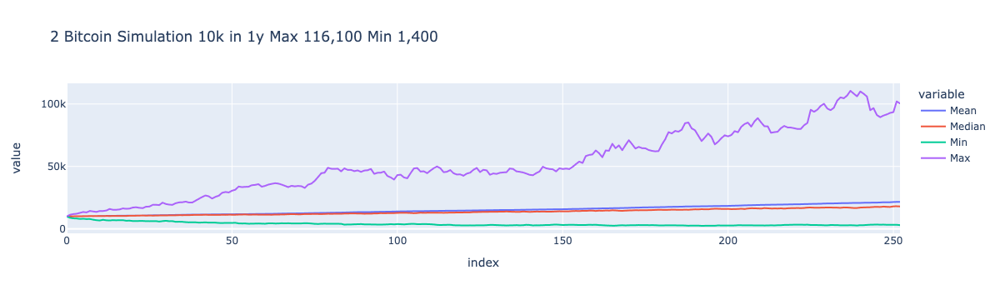

In [72]:
 # Use the 'plot' function to create a chart of the simulated profits/losses
    
    
MC_BTC_plot = px.line(btc_cumulative_pnl, title="2 Bitcoin Simulation 10k in 1y Max 116,100 Min 1,400")    
px.line(btc_cumulative_pnl, title="2 Bitcoin Simulation 10k in 1y Max 116,100 Min 1,400")



# Panels / Dashboard

In [73]:
#import hvplot.pandas
df1 = pd.DataFrame(btc_tbl)
df2 = pd.DataFrame(eth_tbl)
df3 = pd.DataFrame(spy_tbl)
#df.hvplot.table()

In [74]:
df1 = btc_tbl.rename("btc")
df2 = eth_tbl.rename("eth")
df3 = spy_tbl.rename("spy")

In [75]:
df = pd.concat([df1,df2,df3], join="outer", axis=1)
df.head(55)

,btc,eth,spy
count,500.000000,500.000000,500.000000
mean,2.161480,3.116411,1.142893
std,1.392608,2.997681,0.212088
min,0.300912,0.071282,0.673860
25%,1.198429,1.282931,1.003142
50%,1.795033,2.182546,1.124826
75%,2.708171,3.744882,1.266993
max,10.041736,22.052482,1.895294
95% CI Lower,0.574376,0.413936,0.757225
95% CI Upper,5.635827,12.152462,1.599133


In [76]:
# import plotly.graph_objects as go
# fig = go.Figure(data = go.Table(df.to_dict()))

In [77]:


title = pn.pane.Markdown(
    """
#  Risk Return Comparison of Bitcoin, Ethereum and SPY ETF

### 1.  Cumulative Return Chart: Since 2017 of ETH, BTC, SPY & 3 Eth & SPY Blended portfolios
###     And Blox Plot
### 2.  Sharpe Ratio Table & Chart, Volatility
### 3.  Monte Carlo Simulation:  1y Projected Return Plot
### 4.  Monte Carlo Simulation:  Table
### 5.  Beta Plots 
""",
    width=800,
)

In [78]:
dashboard = pn.Tabs(
    ("Welcome", title),
    ("1. Cumulative Return", pn.Column(plotly_cum_return, box_plot)),
    ("2. Sharpe & Volatility", pn.Column(sharpe_table, sharpe, plotly_std)),
    ("3. Monte Carlo Return", pn.Column(MC_SPY_plot, MC_BTC_plot, MC_ETH_plot)),
    ("4. Monte Carlo Table", pn.Row(df)),
    ("5. Beta", pn.Column(be, bb))
    )
    

In [79]:
dashboard.servable()

Tabs
    [0] Markdown(str, width=800)
    [1] Column
        [0] Plotly(Figure, visible=False)
        [1] Plotly(Figure, visible=False)
    [2] Column
        [0] DataFrame(DataFrame)
        [1] Plotly(Figure, visible=False)
        [2] Plotly(Figure, visible=False)
    [3] Column
        [0] Plotly(Figure, visible=False)
        [1] Plotly(Figure, visible=False)
        [2] Plotly(Figure, visible=False)
    [4] Row
        [0] DataFrame(DataFrame)
    [5] Column
        [0] Plotly(Figure, visible=False)
        [1] Plotly(Figure, visible=False)